# Max height map

## Base imports and function

In [3]:
from reader import Reader
import matplotlib.pyplot as plt
import numpy as np
from math import sin, cos, sqrt, atan2, radians
from datetime import datetime
from datetime import date as date_creator
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from numba import njit
import pandas as pd
import os
from numba import jit
from tqdm import tqdm

%matplotlib inline

C:\Users\barroisl\AppData\Local\Temp\ipykernel_14252\3668729426.py:11: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [4]:
def smooth(x,window_len=11,window='hanning'):
        if x.ndim != 1:
                raise ValueError("smooth only accepts 1 dimension arrays.")
        if x.size < window_len:
                raise ValueError("Input vector needs to be bigger than window size.")
        if window_len<3:
                return x
        if not window in ['flat', 'hanning', 'hamming', 'bartlett', 'blackman']:
                raise ValueError("Window is on of 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'")
        s=np.r_[2*x[0]-x[window_len-1::-1],x,2*x[-1]-x[-1:-window_len:-1]]
        if window == 'flat': #moving average
                w=np.ones(window_len,'d')
        else:
                w=eval('np.'+window+'(window_len)')
        y=np.convolve(w/w.sum(),s,mode='same')
        return y[window_len:-window_len+1]
def get_date_time_dif(start_time,stop_time):
    date = date_creator(1, 1, 1)
    datetime1 = datetime.combine(date, start_time)
    datetime2 = datetime.combine(date, stop_time)
    time_elapsed = datetime1 - datetime2
    return time_elapsed.total_seconds()
def compute_dist(lat1,lon1,lat2,lon2,rad=True):
    if not(rad):
        lat1 = radians(lat1)
        lon1 = radians(lon1)
        lat2 = radians(lat2)
        lon2 = radians(lon2)
    # approximate radius of earth in m
    R = 6373_000.0
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat / 2) ** 2 + cos(lat1) * cos(lat2) * sin(dlon / 2) ** 2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return R * c
def remove_zero_from_alti(alti):
    if alti[0] < 10 :
        alti[0] = alti[1]
    if alti[-1] < 10 :
        alti[-1] = alti[-2]
    for i,alt in enumerate(alti):
        if alt < 10 :
            if i >= len(alti)-1 :
                alti[i] = (alti[i-1]+alti[i])/2
            else :  
                alti[i] = (alti[i-1]+alti[i+1])/2
    return alti

def read_igc(file):
    with open(file, 'r') as f:
        parsed_igc_file = Reader().read(f)
    # print('igc_file created')
    previous_lat = 0
    previous_lon = 0
    
    all_lon = np.zeros(len(parsed_igc_file['fix_records'][1]))
    all_lat = np.zeros(len(parsed_igc_file['fix_records'][1]))
    all_speed=np.zeros(len(parsed_igc_file['fix_records'][1]))
    all_vz=np.zeros(len(parsed_igc_file['fix_records'][1]))
    all_alti=np.zeros(len(parsed_igc_file['fix_records'][1]))
    all_time=[0 for _ in range(len(parsed_igc_file['fix_records'][1]))]

    for i,record in enumerate(parsed_igc_file['fix_records'][1]):
        record['time'] = record['time'].replace(hour=record['time'].hour + 1)
        all_lat[i] = record['lat']
        all_lon[i] = record['lon']
        if previous_lon ==0 :
            previous_lat = record['lat']
            previous_lon = record['lon']
            previous_datetime = record['time']
            previous_alt_gps = record['gps_alt']
            # previous_alt_baro = record['pressure_alt']
            all_time[i] = record['time']
        else :
            dxy = abs(compute_dist(previous_lat,previous_lon,record['lat'],record['lon'],rad=False))
            # dz = previous_alt_baro-record['pressure_alt']
            dz = previous_alt_gps-record['gps_alt']
            dt = get_date_time_dif(record['time'],previous_datetime)
            # if dt>2 : print('dtttttt>2 ',dt)
            if dt>0 :
                all_speed[i] = min(100,dxy/dt*3.6)
                all_vz[i] = dz/dt
            all_alti[i] = record['gps_alt']
            all_time[i] = record['time']
            
            previous_lat = record['lat']
            previous_lon = record['lon']
            previous_datetime = record['time']
            previous_alt_gps = record['gps_alt']
            # previous_alt_baro = record['pressure_alt']

            # if previous_datetime.hour>10 :
            #     all_speed = all_speed[:i]
            #     all_vz = all_vz[:i]
            #     all_alti = all_alti[:i]
            #     break
#    return all_lon,all_lat,all_speed,all_vz,remove_zero_from_alti(all_alti),all_time
    return all_lon,all_lat,all_alti,all_time

In [5]:
import matplotlib.ticker as mticker

@njit
def get_cell_coordinates(lons, lats,longitude, latitude):
    cell_longitude = int((longitude-lons[0]) / (lons[1] - lons[0]))
    cell_latitude = int((latitude-lats[0]) / (lats[1] - lats[0]))
    
    return cell_latitude,cell_longitude
    
def pre_max_height_traces_carto(values,all,nlat,nlon,lons,lats):
    all_lon = all[:,0]
    all_lat = all[:,1]
    all_alti = all[:,2] 
    for j,k,l in zip(all_lon,all_lat,all_alti) :
        if np.min(lons) <= j <= np.max(lons) and np.min(lats) <= k <= np.max(lats) :
            cell_coordinates = get_cell_coordinates(lons, lats,j, k)
            if values[cell_coordinates[0],cell_coordinates[1]] == 0 :
                values[cell_coordinates[0],cell_coordinates[1]] = l
            else :
                if l > values[cell_coordinates[0],cell_coordinates[1]] :
                    values[cell_coordinates[0],cell_coordinates[1]] = l
    return values
    
def save_max_height_traces_carto(img_extent,nlon,nlat):
    days = ['IGC_19-08-2023/','IGC_20-08-2023/','IGC_21-08-2023/','IGC_22-08-2023/','IGC_23-08-2023/','IGC_24-08-2023/']
    ndarray_save_path = 'T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/'
    data_path = 'T:/C2H/STAGES/LEO_BARROIS/ndarray/traces/'
    type_vols = ['Parapente/','Planeur/']
    
    lons = np.linspace(img_extent[0], img_extent[1], nlon)
    lats = np.linspace(img_extent[2],img_extent[3], nlat)
    
    np_load_old = np.load
    np.load = lambda *a,**k: np_load_old(*a, allow_pickle=True, **k)
    
    for j in range(2):  
        for i in range(6):
            values = np.zeros((nlat,nlon))
            path = data_path + days[i] + type_vols[j]
            files = [f for f in os.listdir(path) if f.endswith('.npy')]
            for k in files :  
                datas = np.load(join(path,k))[:,:-1] 
                values = pre_max_height_traces_carto(values,datas,nlat-1,nlon-1,lons[:-1],lats[:-1])
            np.save(path[:-1]+'.npy',values)
            print(days[i] + type_vols[j] + ' ok')
    np.load = np_load_old

@njit()
def merge_to_max(values1,values2):
    n,m = np.shape(values1)
    values = np.zeros((n,m))
    for i in range(n):
        for j in range(m):
            if values1[i,j]>= values2[i,j] :
                values[i,j] =  values1[i,j]
            else :
                values[i,j] =  values2[i,j]
    return values

## Saving data : Done

In [23]:
img_extent = (4.7942, 8.1545, 43.3545, 46.6707)
nlon = 500
nlat = 500
save_max_height_traces_carto(img_extent,nlon,nlat)

NameError: name 'join' is not defined

## Plotting traces

In [4]:

@njit()
def find_ticks(img_extent,nlat,nlon):
    dlat = (img_extent[3]-img_extent[2])/nlat
    dlon = (img_extent[1]-img_extent[0])/nlon
    lon_to_find = [5,6,7,8]
    lat_to_find = [44,45,46]
    val_lon = []
    val_lat = []
    for i in range(len(lon_to_find)) :
        val_lon.append((lon_to_find[i]-img_extent[0])//dlon)
    for i in range(len(lat_to_find)) :
        val_lat.append((lat_to_find[i]-img_extent[2])//dlat)
    return val_lon,val_lat

def plot_max_height(img_extent,type_vol,save_title,vmax):
    ndarray_save_path = 'T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/'
    type_vols = ['Parapente/','Planeur/']
    days = ['IGC_19-08-2023/','IGC_20-08-2023/','IGC_21-08-2023/','IGC_22-08-2023/','IGC_23-08-2023/','IGC_24-08-2023/']
    titres = ["19-08-2023-13-01","20-08-2023-12-28","21-08-2023-12-46","22-08-2023-12-40","23-08-2023-12-21","24-08-2023-13-13"]
    directory_sat = 'C:/Users/barroisl/Documents/Stage_Léo/Satellites/Images_MODIS_VIIRS/'
    fnames = ['Alp_2023-08-19_13H01.jpg','Alp_2023-08-20_12H28.jpg','Alp_2023-08-21_12H46.jpg',
          'Alp_2023-08-22_12H40.jpg','Alp_2023-08-23_12H21.jpg','Alp_2023-08-24_13H13.jpg']
    fig,axs = plt.subplots(nrows=2,ncols=3,figsize=(16, 14))

    nlat,nlon = 500,500
    xticks,yticks = find_ticks(img_extent,nlat,nlon)

    xlabels = [int(((img_extent[1]-img_extent[0])/500)*i + img_extent[0]) for i in xticks]
    ylabels = [int(((img_extent[3]-img_extent[2])/500)*i + img_extent[2]) for i in yticks]
   
    for i in range(6):
        ax = axs[i//3,i%3]
        if type_vol == 'para' :
            path_type = 'Parapente.npy'
        elif type_vol == 'plan' :
            path_type = 'Planeur.npy'
        elif type_vol == 'both' :
            path_type = 'both.npy'
        img = plt.imread(os.path.join(directory_sat,fnames[i]))
        ax.imshow(img, extent=[0, 500, 0, 500])
        
        values = np.load('T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/'+days[i]+path_type)
        nlat,nlon = np.shape(values)
        max_height = np.max(values)
        ind = (values == 0)
        new_values = np.ma.masked_array(values,mask=ind)
        
#        vmax = (int(np.max(values)/100)+1)*100
        vmin = 0

        cax = ax.pcolormesh(new_values, vmin=vmin, vmax=vmax, cmap='coolwarm')
        ax.set_title(titres[i]+ ' (max '+str(max_height) + ' m asl)')
        ax.set_xticks(xticks, labels=xlabels)
        ax.set_yticks(yticks, labels=ylabels)
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")
        
    cbar = fig.colorbar(cax,
                        ax = axs,
                        ticks=[0, vmax/2, vmax],
                        format=mticker.FixedFormatter(['0', str(vmax/2), str(vmax)]),
                        extend='both',
                        orientation='horizontal',
                        label = 'Maximum height asl (m)',
                        fraction = 0.03
                        )

    plt.savefig(save_title)
    plt.show()

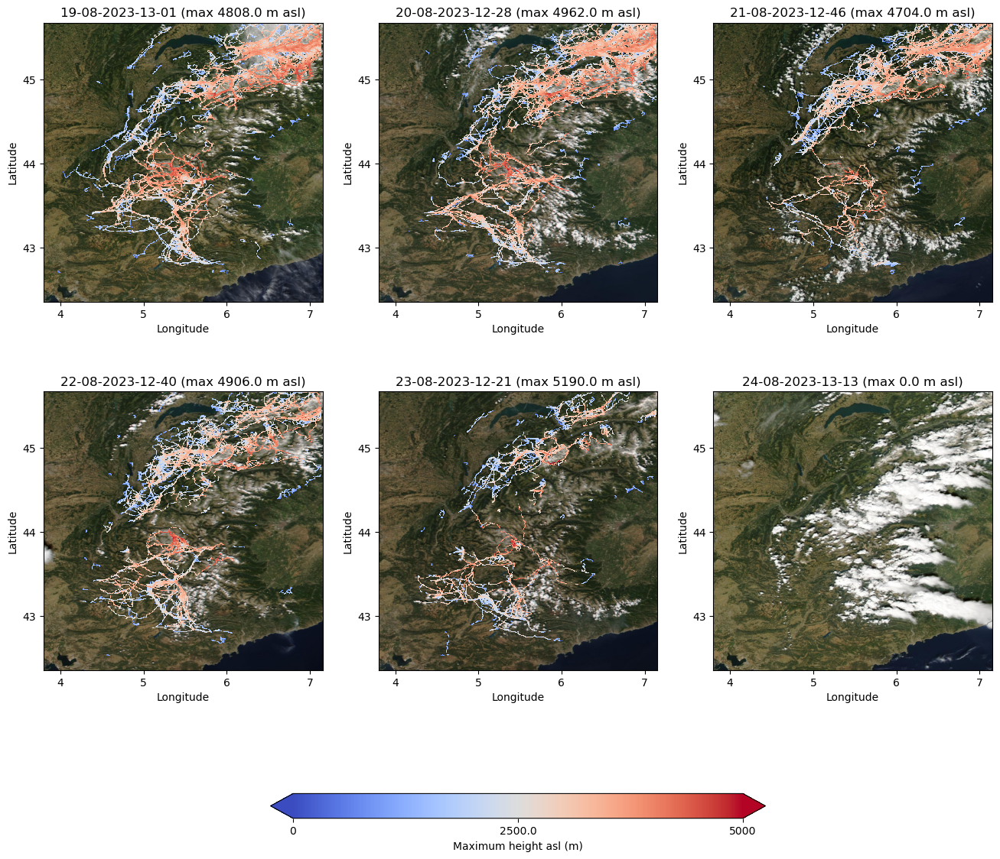

In [5]:
img_extent = (4.7942, 8.1545, 43.3545, 46.6707)
type_vols = ['para','plan']
save_title = 'T:/C2H/STAGES/LEO_BARROIS/figures/max_heght_map_para_2.0.png'
vmax = 5000

plot_max_height(img_extent,type_vols[0],save_title,vmax)

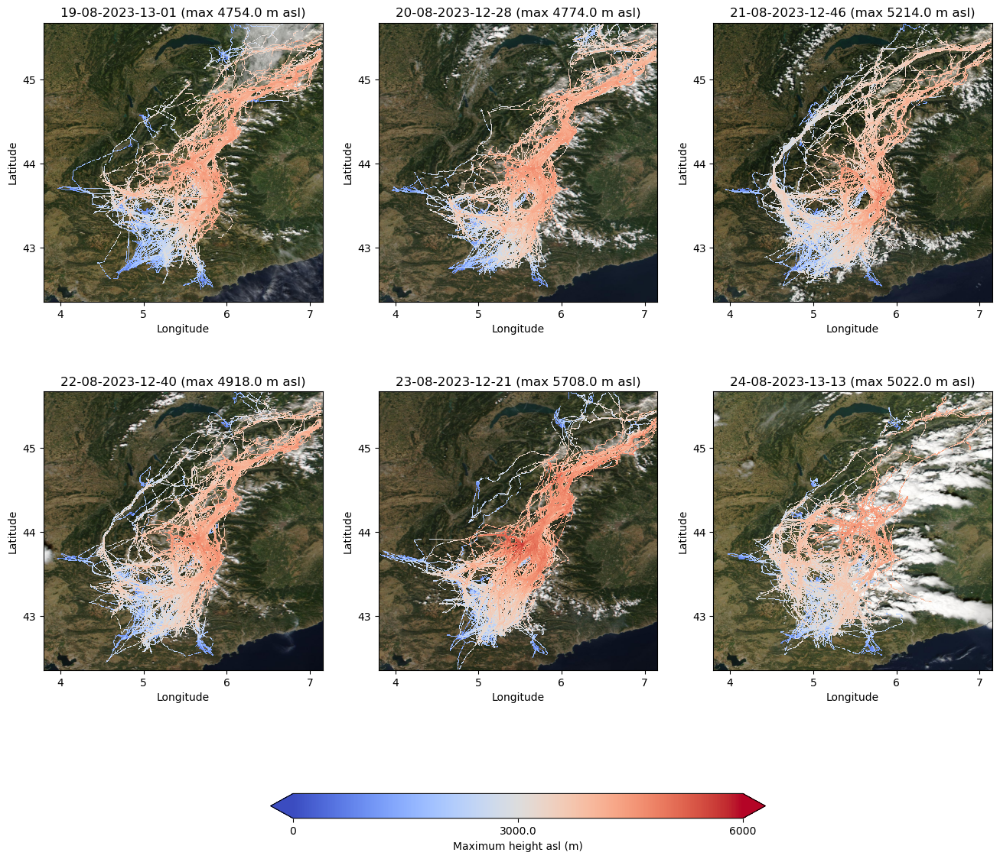

In [6]:
img_extent = (4.7942, 8.1545, 43.3545, 46.6707)
type_vols = ['para','plan']
save_title = 'T:/C2H/STAGES/LEO_BARROIS/figures/max_heght_map_plan_2.0.png'
vmax = 6000

plot_max_height(img_extent,type_vols[1],save_title,vmax)

## Distribution height plot

In [60]:
def plot_dist_height():
    ndarray_save_path = 'T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_speed_map/'
    type_vols = ['Parapente/','Planeur/']
    days = ['IGC_19-08-2023/','IGC_20-08-2023/','IGC_21-08-2023/','IGC_22-08-2023/','IGC_23-08-2023/','IGC_24-08-2023/']
    titres = ["19-08-2023-13-01","20-08-2023-12-28","21-08-2023-12-46","22-08-2023-12-40","23-08-2023-12-21","24-08-2023-13-13"]
    
    fig,axs = plt.subplots(nrows=2,ncols=3,figsize=(16, 14))
    a = [-1.1 for i in range(1300)]
    
    for i in range(6):
        if i != 5 :
            ax = axs[i//3,i%3]
            
            values_para = np.ravel(np.load('T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/'+days[i]+'Parapente.npy'))
#            liste_para = [val for val in values_para if val != 0]
#            threshold_para = np.percentile(liste_para, 99.5)
#            threshold2_para = np.percentile(liste_para, 0.5)
#            liste_para = [val for val in liste_para if threshold2_para < val < threshold_para]
            liste_para = [val for val in values_para if 0 < val ]
            
            ax.hist(liste_para, bins=100, linewidth=0.5, alpha = 0.3, color = 'b',edgecolor="white")
            
    
            values_plan = np.ravel(np.load('T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/'+days[i]+'Planeur.npy'))
            liste_plan = [val for val in values_plan if 10 < val ]
#            threshold_plan = np.percentile(liste_plan, 99.5)
#            threshold2_plan = np.percentile(liste_plan, 0.5)
#            liste_plan = [val for val in liste_plan if threshold2_plan < val < threshold_plan]
            ax.hist(liste_plan, bins=100, linewidth=0.5, alpha = 0.3, color = 'r',edgecolor="white")
            ax.set_xlabel('Maximum height')
            ax.set_title('Para : [' +str(np.min(liste_para))[:3]+';' +str(np.max(liste_para))[:4] +'] Plan : [' + str(np.min(liste_plan))[:5]+';' +str(np.max(liste_plan))[:4]+']')

                          
        else :
            ax = axs[i//3,i%3]
            values_plan = np.ravel(np.load('T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/'+days[i]+'Planeur.npy'))
            liste_plan = [val for val in values_plan if 10 < val ]
#            liste_plan = [val for val in values_plan if val != -9999]
#            threshold_plan = np.percentile(liste_plan, 99.5)
#            liste_plan = [val for val in liste_plan if threshold2_plan < val < threshold_plan]
#            liste_plan = [val for val in liste_plan if threshold2_plan < val]
            
            
            
            ax.hist([-100], bins=1, linewidth=0.5, alpha = 0.3, color = 'b',edgecolor="white",label ='Parapente')
            ax.hist([-100], bins=1, linewidth=0.5, alpha = 0.3, color = 'r',edgecolor="white",label ='Planeur')
            ax.hist(liste_plan, bins=100, linewidth=0.5, alpha = 0.3, color = 'r',edgecolor="white")
            ax.set(xlim=(0, 6000))
            ax.set_xlabel('Maximum height')
            ax.set_title('Plan : [' + str(np.min(liste_plan))[:3]+';' +str(np.max(liste_plan))[:4]+']')

    plt.savefig('T:/C2H/STAGES/LEO_BARROIS/figures/max_height_map_dist.png')
    fig.suptitle('First order boundary layer height distribution',fontsize=15)
    plt.legend()
    plt.tight_layout()
    plt.show()

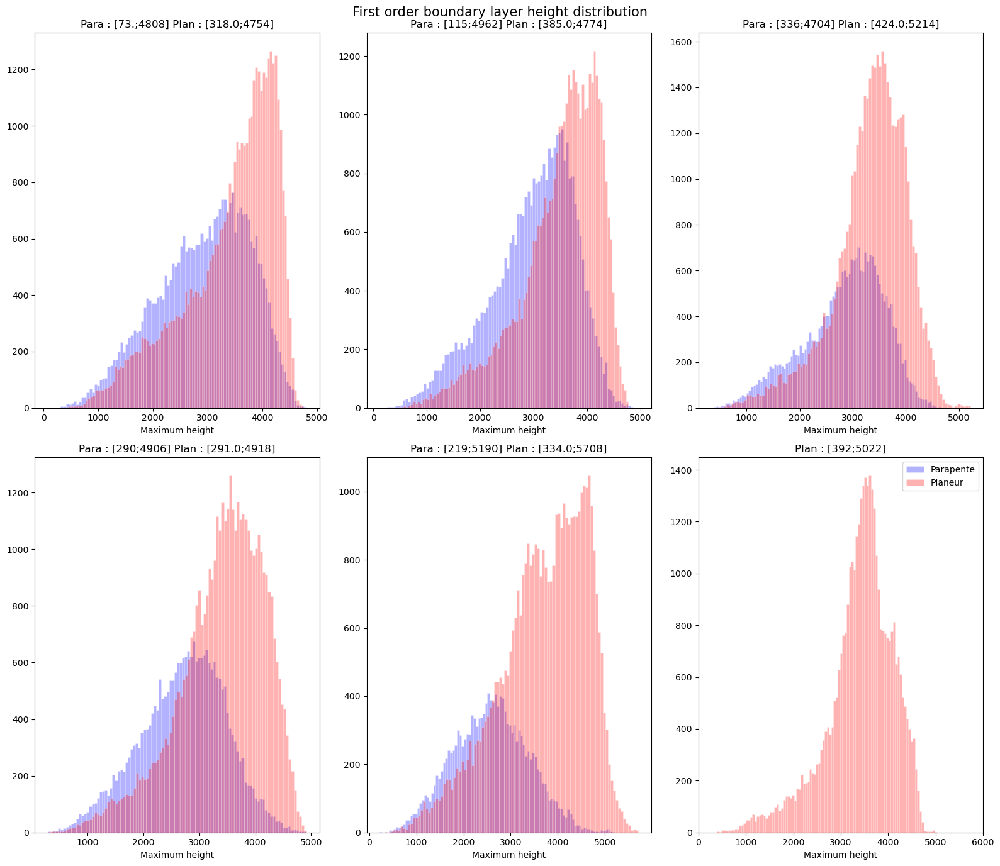

In [61]:
plot_dist_height()

## Investigating highest point

In [68]:
def plot_max_heighest(type_vol,save_title,vmax):
    ndarray_save_path = 'T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/'
    type_vols = ['Parapente/','Planeur/']
    days = ['IGC_19-08-2023/','IGC_20-08-2023/','IGC_21-08-2023/','IGC_22-08-2023/','IGC_23-08-2023/','IGC_24-08-2023/']
    titres = ["19-08-2023-13-01","20-08-2023-12-28","21-08-2023-12-46","22-08-2023-12-40","23-08-2023-12-21","24-08-2023-13-13"]
    fig,axs = plt.subplots(nrows=2,ncols=3,figsize=(16, 14))
   
    for i in range(6):
        ax = axs[i//3,i%3]
        if type_vol == 'para' :
            path_type = 'Parapente.npy'
        elif type_vol == 'plan' :
            path_type = 'Planeur.npy'
        elif type_vol == 'both' :
            path_type = 'both.npy'
        
        values = np.load('T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/'+days[i]+path_type)
        nlat,nlon = np.shape(values)
        max_height = np.max(values)
        ind = (values == 0)
        new_values = np.ma.masked_array(values,mask=ind)
        
#        vmax = (int(np.max(values)/100)+1)*100
        vmin = 0

        cax = ax.pcolormesh(new_values[150:275,150:350], vmin=vmin, vmax=vmax, cmap='coolwarm')
        ax.set_title(titres[i]+ ' (max '+str(max_height) + ' m asl)')

    cbar = fig.colorbar(cax,
                        ax = axs,
                        ticks=[0, vmax/2, vmax],
                        format=mticker.FixedFormatter(['0', str(vmax/2), str(vmax)]),
                        extend='both',
                        orientation='horizontal',
                        label = 'Maximum height asl (m)',
                        fraction = 0.03
                        )

    plt.savefig(save_title)
    plt.show()

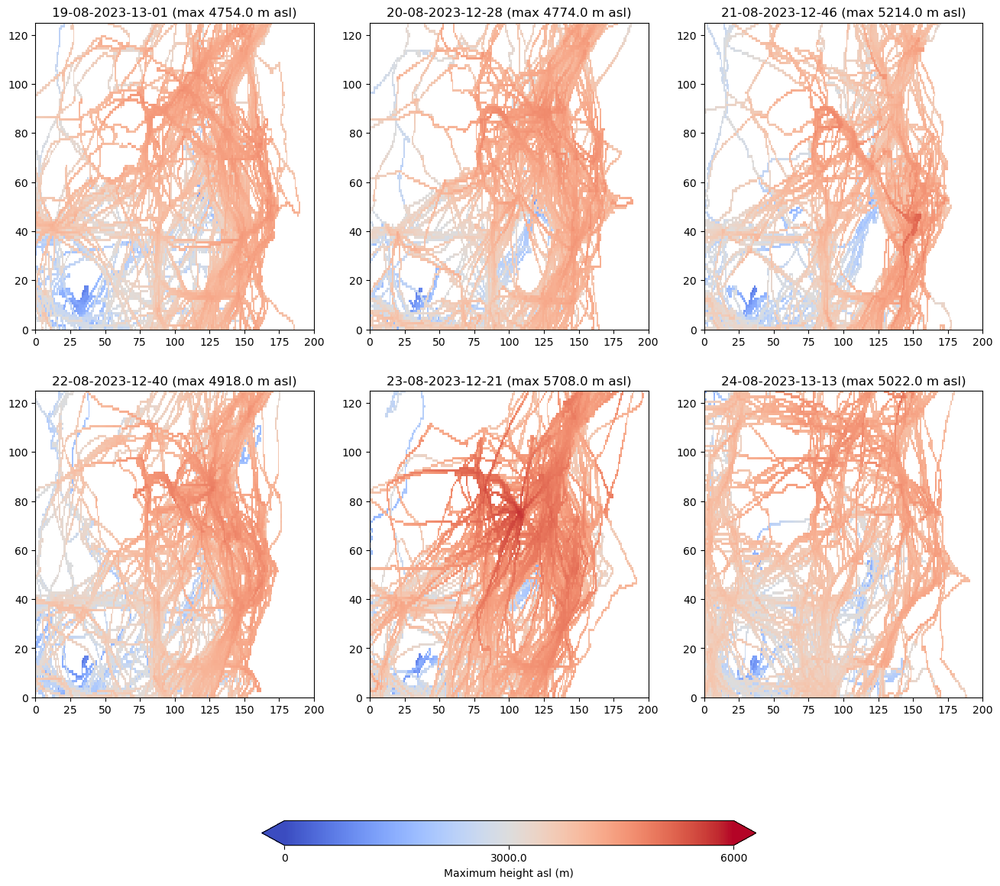

In [69]:
img_extent = (4.7942, 8.1545, 43.3545, 46.6707)
type_vols = ['para','plan']
save_title = 'T:/C2H/STAGES/LEO_BARROIS/figures/max_height_map_plan_highest.png'
vmax = 6000

plot_max_heighest(type_vols[1],save_title,vmax)

In [66]:
def plot_dist_heighest():
    ndarray_save_path = 'T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_speed_map/'
    type_vols = ['Parapente/','Planeur/']
    days = ['IGC_19-08-2023/','IGC_20-08-2023/','IGC_21-08-2023/','IGC_22-08-2023/','IGC_23-08-2023/','IGC_24-08-2023/']
    titres = ["19-08-2023-13-01","20-08-2023-12-28","21-08-2023-12-46","22-08-2023-12-40","23-08-2023-12-21","24-08-2023-13-13"]
    
    fig,axs = plt.subplots(nrows=2,ncols=3,figsize=(16, 14))
    a = [-1.1 for i in range(1300)]
    
    for i in range(6):
        if i != 5 :
            ax = axs[i//3,i%3]
            
            values_para = np.load('T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/'+days[i]+'Parapente.npy')
            values_para = np.ravel(values_para[150:275,150:350])
#            liste_para = [val for val in values_para if val != 0]
#            threshold_para = np.percentile(liste_para, 99.5)
#            threshold2_para = np.percentile(liste_para, 0.5)
#            liste_para = [val for val in liste_para if threshold2_para < val < threshold_para]
            liste_para = [val for val in values_para if 0 < val ]
            
            ax.hist(liste_para, bins=100, linewidth=0.5, alpha = 0.3, color = 'b',edgecolor="white")
            
    
            values_plan = np.load('T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/'+days[i]+'Planeur.npy')
            values_plan = np.ravel(values_plan[150:275,150:350])
            liste_plan = [val for val in values_plan if 10 < val ]
#            threshold_plan = np.percentile(liste_plan, 99.5)
#            threshold2_plan = np.percentile(liste_plan, 0.5)
#            liste_plan = [val for val in liste_plan if threshold2_plan < val < threshold_plan]
            ax.hist(liste_plan, bins=100, linewidth=0.5, alpha = 0.3, color = 'r',edgecolor="white")
            ax.set_xlabel('Maximum height')
            ax.set_title('Para : [' +str(np.min(liste_para))[:3]+';' +str(np.max(liste_para))[:4] +'] Plan : [' + str(np.min(liste_plan))[:5]+';' +str(np.max(liste_plan))[:4]+']')

                          
        else :
            ax = axs[i//3,i%3]
            values_plan = np.load('T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/'+days[i]+'Planeur.npy')
            values_plan = np.ravel(values_plan[150:275,150:350])
            liste_plan = [val for val in values_plan if 10 < val ]
#            liste_plan = [val for val in values_plan if val != -9999]
#            threshold_plan = np.percentile(liste_plan, 99.5)
#            liste_plan = [val for val in liste_plan if threshold2_plan < val < threshold_plan]
#            liste_plan = [val for val in liste_plan if threshold2_plan < val]
            
            
            
            ax.hist([-100], bins=1, linewidth=0.5, alpha = 0.3, color = 'b',edgecolor="white",label ='Parapente')
            ax.hist([-100], bins=1, linewidth=0.5, alpha = 0.3, color = 'r',edgecolor="white",label ='Planeur')
            ax.hist(liste_plan, bins=100, linewidth=0.5, alpha = 0.3, color = 'r',edgecolor="white")
            ax.set(xlim=(0, 6000))
            ax.set_xlabel('Maximum height')
            ax.set_title('Plan : [' + str(np.min(liste_plan))[:3]+';' +str(np.max(liste_plan))[:4]+']')

    plt.savefig('T:/C2H/STAGES/LEO_BARROIS/figures/max_height_map_dist_highest.png')
    fig.suptitle('First order boundary layer height distribution',fontsize=15)
    plt.legend()
    plt.tight_layout()
    plt.show()

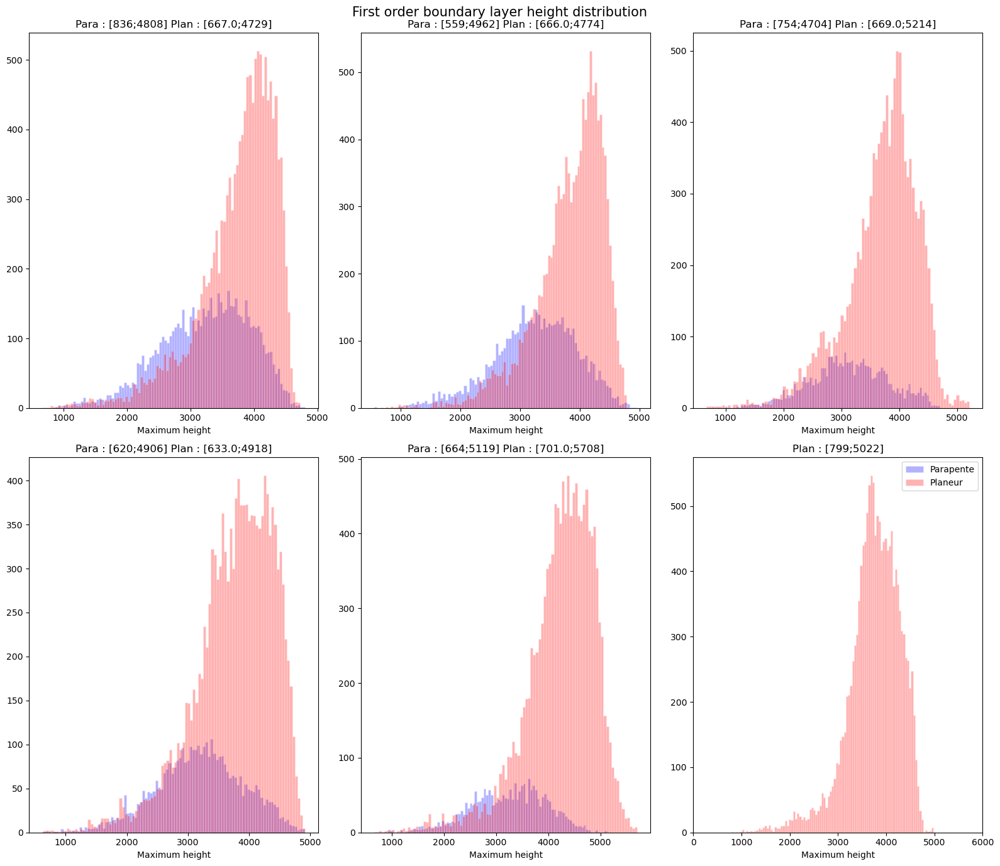

In [67]:
plot_dist_heighest()

## Division in 2h segments for each days

In [4]:
def save_max_height_traces_carto_sequential(img_extent,nlon,nlat):
    days = ['IGC_19-08-2023/','IGC_20-08-2023/','IGC_21-08-2023/','IGC_22-08-2023/','IGC_23-08-2023/','IGC_24-08-2023/']
    ndarray_save_path = 'T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/'
    data_path = 'T:/C2H/STAGES/LEO_BARROIS/ndarray/traces/'
    type_vols = ['Parapente/','Planeur/']

    time_stemps = [[i*2,(i+1)*2] for i in range(3,11)]
    
    lons = np.linspace(img_extent[0], img_extent[1], nlon)
    lats = np.linspace(img_extent[2],img_extent[3], nlat)
    np_load_old = np.load
    np.load = lambda *a,**k: np_load_old(*a, allow_pickle=True, **k)
    
    for j in range(2):  
        for i in range(6):
            for m in tqdm(range(len(time_stemps))):
                if j != 0 or i != 0 or m >=4 :
                    time_stemp = time_stemps[m]
                    values = np.zeros((nlat,nlon))
                    path = data_path + days[i] + type_vols[j]
                    files = [f for f in os.listdir(path) if f.endswith('.npy')]
                    for k in files :  
                        datas = np.load(os.path.join(path,k))
                        all = np.array([datas[i,:-1] for i in range(len(datas[:,0])) if datas[i,-1].hour <= time_stemp[1] and datas[i,-1].hour >= time_stemp[0]])
                        if len(all) != 0 :
                            values = pre_max_height_traces_carto(values,all,nlat-1,nlon-1,lons[:-1],lats[:-1])
                    np.save(ndarray_save_path + days[i] + type_vols[j][:-1]+ '_'+ str(time_stemp[0])+'_'+str(time_stemp[1]) +'.npy',values)
                    print(str(time_stemp) + ' ok')
            print(days[i] + type_vols[j] + ' ok')
    np.load = np_load_old

In [5]:
img_extent = (4.7942, 8.1545, 43.3545, 46.6707)
nlon = 500
nlat = 500
save_max_height_traces_carto_sequential(img_extent,nlon,nlat)

 62%|████████████████████████████████████████████████████▌                               | 5/8 [05:45<03:27, 69.16s/it]

[14, 16] ok


 75%|██████████████████████████████████████████████████████████████▎                    | 6/8 [10:56<04:05, 122.74s/it]

[16, 18] ok


 88%|████████████████████████████████████████████████████████████████████████▋          | 7/8 [15:45<02:42, 162.91s/it]

[18, 20] ok


100%|███████████████████████████████████████████████████████████████████████████████████| 8/8 [20:28<00:00, 153.50s/it]


[20, 22] ok
IGC_19-08-2023/Parapente/ ok


 12%|██████████▍                                                                        | 1/8 [06:29<45:29, 389.88s/it]

[6, 8] ok


 25%|████████████████████▊                                                              | 2/8 [11:33<33:55, 339.25s/it]

[8, 10] ok


 38%|███████████████████████████████▏                                                   | 3/8 [18:09<30:26, 365.23s/it]

[10, 12] ok


 50%|█████████████████████████████████████████▌                                         | 4/8 [24:36<24:55, 373.80s/it]

[12, 14] ok


 62%|███████████████████████████████████████████████████▉                               | 5/8 [30:27<18:16, 365.60s/it]

[14, 16] ok


 75%|██████████████████████████████████████████████████████████████▎                    | 6/8 [35:49<11:41, 350.52s/it]

[16, 18] ok


 88%|████████████████████████████████████████████████████████████████████████▋          | 7/8 [40:45<05:32, 332.73s/it]

[18, 20] ok


100%|███████████████████████████████████████████████████████████████████████████████████| 8/8 [45:33<00:00, 341.69s/it]


[20, 22] ok
IGC_20-08-2023/Parapente/ ok


 12%|██████████▍                                                                        | 1/8 [04:10<29:12, 250.36s/it]

[6, 8] ok


 25%|████████████████████▊                                                              | 2/8 [07:55<23:31, 235.25s/it]

[8, 10] ok


 38%|███████████████████████████████▏                                                   | 3/8 [12:26<20:58, 251.70s/it]

[10, 12] ok


 50%|█████████████████████████████████████████▌                                         | 4/8 [16:50<17:06, 256.51s/it]

[12, 14] ok


 62%|███████████████████████████████████████████████████▉                               | 5/8 [20:49<12:30, 250.33s/it]

[14, 16] ok


 75%|██████████████████████████████████████████████████████████████▎                    | 6/8 [24:55<08:17, 248.97s/it]

[16, 18] ok


 88%|████████████████████████████████████████████████████████████████████████▋          | 7/8 [28:36<03:59, 239.84s/it]

[18, 20] ok


100%|███████████████████████████████████████████████████████████████████████████████████| 8/8 [32:01<00:00, 240.24s/it]


[20, 22] ok
IGC_21-08-2023/Parapente/ ok


 12%|██████████▍                                                                        | 1/8 [03:44<26:14, 224.88s/it]

[6, 8] ok


 25%|████████████████████▊                                                              | 2/8 [07:04<20:58, 209.83s/it]

[8, 10] ok


 38%|███████████████████████████████▏                                                   | 3/8 [11:00<18:29, 221.81s/it]

[10, 12] ok


 50%|█████████████████████████████████████████▌                                         | 4/8 [14:58<15:13, 228.38s/it]

[12, 14] ok


 62%|███████████████████████████████████████████████████▉                               | 5/8 [19:22<12:03, 241.15s/it]

[14, 16] ok


 75%|██████████████████████████████████████████████████████████████▎                    | 6/8 [22:53<07:41, 230.81s/it]

[16, 18] ok


 88%|████████████████████████████████████████████████████████████████████████▋          | 7/8 [25:43<03:31, 211.14s/it]

[18, 20] ok


100%|███████████████████████████████████████████████████████████████████████████████████| 8/8 [29:08<00:00, 218.59s/it]


[20, 22] ok
IGC_22-08-2023/Parapente/ ok


 12%|██████████▍                                                                        | 1/8 [02:12<15:26, 132.34s/it]

[6, 8] ok


 25%|████████████████████▊                                                              | 2/8 [03:53<11:23, 113.84s/it]

[8, 10] ok


 38%|███████████████████████████████▏                                                   | 3/8 [06:06<10:14, 122.85s/it]

[10, 12] ok


 50%|█████████████████████████████████████████▌                                         | 4/8 [08:28<08:40, 130.19s/it]

[12, 14] ok


 62%|███████████████████████████████████████████████████▉                               | 5/8 [10:25<06:17, 125.68s/it]

[14, 16] ok


 75%|██████████████████████████████████████████████████████████████▎                    | 6/8 [12:14<03:59, 119.91s/it]

[16, 18] ok


 88%|████████████████████████████████████████████████████████████████████████▋          | 7/8 [13:48<01:51, 111.51s/it]

[18, 20] ok


100%|███████████████████████████████████████████████████████████████████████████████████| 8/8 [15:24<00:00, 115.56s/it]


[20, 22] ok
IGC_23-08-2023/Parapente/ ok


 12%|██████████▌                                                                         | 1/8 [00:00<00:02,  2.82it/s]

[6, 8] ok


 25%|█████████████████████                                                               | 2/8 [00:00<00:02,  2.75it/s]

[8, 10] ok


 38%|███████████████████████████████▌                                                    | 3/8 [00:01<00:01,  2.81it/s]

[10, 12] ok


 50%|██████████████████████████████████████████                                          | 4/8 [00:01<00:01,  3.05it/s]

[12, 14] ok


 62%|████████████████████████████████████████████████████▌                               | 5/8 [00:01<00:00,  3.20it/s]

[14, 16] ok


 75%|███████████████████████████████████████████████████████████████                     | 6/8 [00:01<00:00,  3.13it/s]

[16, 18] ok


 88%|█████████████████████████████████████████████████████████████████████████▌          | 7/8 [00:02<00:00,  3.25it/s]

[18, 20] ok


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:02<00:00,  3.07it/s]


[20, 22] ok
IGC_24-08-2023/Parapente/ ok


 12%|██████████▌                                                                         | 1/8 [01:15<08:47, 75.38s/it]

[6, 8] ok


 25%|█████████████████████                                                               | 2/8 [02:18<06:49, 68.33s/it]

[8, 10] ok


 38%|███████████████████████████████▌                                                    | 3/8 [03:42<06:17, 75.56s/it]

[10, 12] ok


 50%|██████████████████████████████████████████                                          | 4/8 [05:32<05:55, 88.83s/it]

[12, 14] ok


 62%|████████████████████████████████████████████████████▌                               | 5/8 [07:12<04:39, 93.07s/it]

[14, 16] ok


 75%|███████████████████████████████████████████████████████████████                     | 6/8 [08:31<02:56, 88.25s/it]

[16, 18] ok


 88%|█████████████████████████████████████████████████████████████████████████▌          | 7/8 [09:34<01:19, 79.87s/it]

[18, 20] ok


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [10:35<00:00, 79.40s/it]


[20, 22] ok
IGC_19-08-2023/Planeur/ ok


 12%|██████████▌                                                                         | 1/8 [00:56<06:32, 56.06s/it]

[6, 8] ok


 25%|█████████████████████                                                               | 2/8 [01:54<05:46, 57.67s/it]

[8, 10] ok


 38%|███████████████████████████████▌                                                    | 3/8 [02:59<05:03, 60.70s/it]

[10, 12] ok


 50%|██████████████████████████████████████████                                          | 4/8 [04:11<04:21, 65.25s/it]

[12, 14] ok


 62%|████████████████████████████████████████████████████▌                               | 5/8 [05:28<03:28, 69.39s/it]

[14, 16] ok


 75%|███████████████████████████████████████████████████████████████                     | 6/8 [06:37<02:18, 69.44s/it]

[16, 18] ok


 88%|█████████████████████████████████████████████████████████████████████████▌          | 7/8 [07:38<01:06, 66.66s/it]

[18, 20] ok


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [08:33<00:00, 64.23s/it]


[20, 22] ok
IGC_20-08-2023/Planeur/ ok


 12%|██████████▌                                                                         | 1/8 [01:05<07:35, 65.06s/it]

[6, 8] ok


 25%|█████████████████████                                                               | 2/8 [02:07<06:22, 63.74s/it]

[8, 10] ok


 38%|███████████████████████████████▌                                                    | 3/8 [03:20<05:38, 67.71s/it]

[10, 12] ok


 50%|██████████████████████████████████████████                                          | 4/8 [04:42<04:54, 73.60s/it]

[12, 14] ok


 62%|████████████████████████████████████████████████████▌                               | 5/8 [06:00<03:45, 75.21s/it]

[14, 16] ok


 75%|███████████████████████████████████████████████████████████████                     | 6/8 [07:25<02:37, 78.53s/it]

[16, 18] ok


 88%|█████████████████████████████████████████████████████████████████████████▌          | 7/8 [08:24<01:12, 72.09s/it]

[18, 20] ok


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [09:25<00:00, 70.75s/it]


[20, 22] ok
IGC_21-08-2023/Planeur/ ok


 12%|██████████▌                                                                         | 1/8 [01:14<08:44, 74.97s/it]

[6, 8] ok


 25%|█████████████████████                                                               | 2/8 [02:09<06:16, 62.68s/it]

[8, 10] ok


 38%|███████████████████████████████▌                                                    | 3/8 [03:21<05:36, 67.25s/it]

[10, 12] ok


 50%|██████████████████████████████████████████                                          | 4/8 [04:40<04:47, 71.86s/it]

[12, 14] ok


 62%|████████████████████████████████████████████████████▌                               | 5/8 [05:57<03:41, 73.69s/it]

[14, 16] ok


 75%|███████████████████████████████████████████████████████████████                     | 6/8 [07:13<02:29, 74.60s/it]

[16, 18] ok


 88%|█████████████████████████████████████████████████████████████████████████▌          | 7/8 [08:11<01:09, 69.16s/it]

[18, 20] ok


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [09:03<00:00, 67.97s/it]


[20, 22] ok
IGC_22-08-2023/Planeur/ ok


 12%|██████████▌                                                                         | 1/8 [01:09<08:08, 69.73s/it]

[6, 8] ok


 25%|█████████████████████                                                               | 2/8 [02:12<06:34, 65.78s/it]

[8, 10] ok


 38%|███████████████████████████████▌                                                    | 3/8 [03:16<05:24, 64.91s/it]

[10, 12] ok


 50%|██████████████████████████████████████████                                          | 4/8 [04:32<04:36, 69.11s/it]

[12, 14] ok


 62%|████████████████████████████████████████████████████▌                               | 5/8 [05:54<03:41, 73.81s/it]

[14, 16] ok


 75%|███████████████████████████████████████████████████████████████                     | 6/8 [07:12<02:30, 75.43s/it]

[16, 18] ok


 88%|█████████████████████████████████████████████████████████████████████████▌          | 7/8 [08:12<01:10, 70.15s/it]

[18, 20] ok


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [09:08<00:00, 68.57s/it]


[20, 22] ok
IGC_23-08-2023/Planeur/ ok


 12%|██████████▌                                                                         | 1/8 [00:45<05:17, 45.33s/it]

[6, 8] ok


 25%|█████████████████████                                                               | 2/8 [01:22<04:04, 40.68s/it]

[8, 10] ok


 38%|███████████████████████████████▌                                                    | 3/8 [02:08<03:34, 42.95s/it]

[10, 12] ok


 50%|██████████████████████████████████████████                                          | 4/8 [02:55<02:58, 44.52s/it]

[12, 14] ok


 62%|████████████████████████████████████████████████████▌                               | 5/8 [03:48<02:23, 47.71s/it]

[14, 16] ok


 75%|███████████████████████████████████████████████████████████████                     | 6/8 [04:33<01:33, 46.81s/it]

[16, 18] ok


 88%|█████████████████████████████████████████████████████████████████████████▌          | 7/8 [05:10<00:43, 43.57s/it]

[18, 20] ok


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [05:48<00:00, 43.50s/it]

[20, 22] ok
IGC_24-08-2023/Planeur/ ok


## Adding maps

In [6]:
def merge_sequential():
    days = ['IGC_19-08-2023/','IGC_20-08-2023/','IGC_21-08-2023/','IGC_22-08-2023/','IGC_23-08-2023/','IGC_24-08-2023/']
    directory = 'T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/'
    type_vols = ['Parapente_','Planeur_']
    time_stemps = ['6_8.npy','8_10.npy','10_12.npy','12_14.npy','14_16.npy','16_18.npy','18_20.npy','20_22.npy']
    for i in days :
        for k in time_stemps :
            a = np.load(directory + i + type_vols[0] + k)
            b = np.load(directory + i + type_vols[1] + k)
            c = merge_to_max(a,b)
            np.save(directory + i + 'both_' + k,c)

In [7]:
merge_sequential()

## Plotting sequential

In [20]:
@njit()
def find_ticks(img_extent,nlat,nlon):
    dlat = (img_extent[3]-img_extent[2])/nlat
    dlon = (img_extent[1]-img_extent[0])/nlon
    lon_to_find = [5,6,7,8]
    lat_to_find = [44,45,46]
    val_lon = []
    val_lat = []
    for i in range(len(lon_to_find)) :
        val_lon.append((lon_to_find[i]-img_extent[0])//dlon)
    for i in range(len(lat_to_find)) :
        val_lat.append((lat_to_find[i]-img_extent[2])//dlat)
    return val_lon,val_lat

def plot_max_height_sequential(img_extent,type_vol,save_title,vmax,day):
#    days = ['IGC_19-08-2023/','IGC_20-08-2023/','IGC_21-08-2023/','IGC_22-08-2023/','IGC_23-08-2023/','IGC_24-08-2023/']
    titres = [str(i*2+6)+'-'+str((i+1)*2+6) for i in range(0,8)]
#    titres = ["19-08-2023-13-01","20-08-2023-12-28","21-08-2023-12-46","22-08-2023-12-40","23-08-2023-12-21","24-08-2023-13-13"]
    directory_sat = 'C:/Users/barroisl/Documents/Stage_Léo/Satellites/Images_MODIS_VIIRS/'
    fnames = 'Alp_2023-08-19_13H01.jpg'
#    fnames = ['Alp_2023-08-19_13H01.jpg','Alp_2023-08-20_12H28.jpg','Alp_2023-08-21_12H46.jpg',
#          'Alp_2023-08-22_12H40.jpg','Alp_2023-08-23_12H21.jpg','Alp_2023-08-24_13H13.jpg']
    time_stemps = [[i*2,(i+1)*2] for i in range(3,11)]
    
    fig,axs = plt.subplots(nrows=2,ncols=4,figsize=(16, 14))

    nlat,nlon = 500,500
    xticks,yticks = find_ticks(img_extent,nlat,nlon)

    xlabels = [int(((img_extent[1]-img_extent[0])/500)*i + img_extent[0]) for i in xticks]
    ylabels = [int(((img_extent[3]-img_extent[2])/500)*i + img_extent[2]) for i in yticks]
   
    for i in range(len(titres)):
        ax = axs[i//4,i%4]
        time_stemp = time_stemps[i]
        if type_vol == 'para' :
            path_type = 'Parapente_'
        elif type_vol == 'plan' :
            path_type = 'Planeur_'
        elif type_vol == 'both' :
            path_type = 'both_'
        img = plt.imread(os.path.join(directory_sat,fnames))
        ax.imshow(img, extent=[0, 500, 0, 500])
        values = np.load('T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/'+day+path_type+str(time_stemp[0])+'_'+str(time_stemp[1]) +'.npy')
        nlat,nlon = np.shape(values)
        max_height = np.max(values)
        ind = (values == 0)
        new_values = np.ma.masked_array(values,mask=ind)
        
#        vmax = (int(np.max(values)/100)+1)*100
        vmin = 0

        cax = ax.pcolormesh(new_values, vmin=vmin, vmax=vmax, cmap='coolwarm')
        ax.set_title(day[4:6] +' '+ titres[i] + ' (max '+str(max_height) + ' m asl)')
        ax.set_xticks(xticks, labels=xlabels)
        ax.set_yticks(yticks, labels=ylabels)
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")
        
    cbar = fig.colorbar(cax,
                        ax = axs,
                        ticks=[0, vmax/2, vmax],
                        format=mticker.FixedFormatter(['0', str(vmax/2), str(vmax)]),
                        extend='both',
                        orientation='horizontal',
                        label = 'Maximum height asl (m)',
                        fraction = 0.03
                        )
    
    plt.savefig(save_title)
    plt.show()

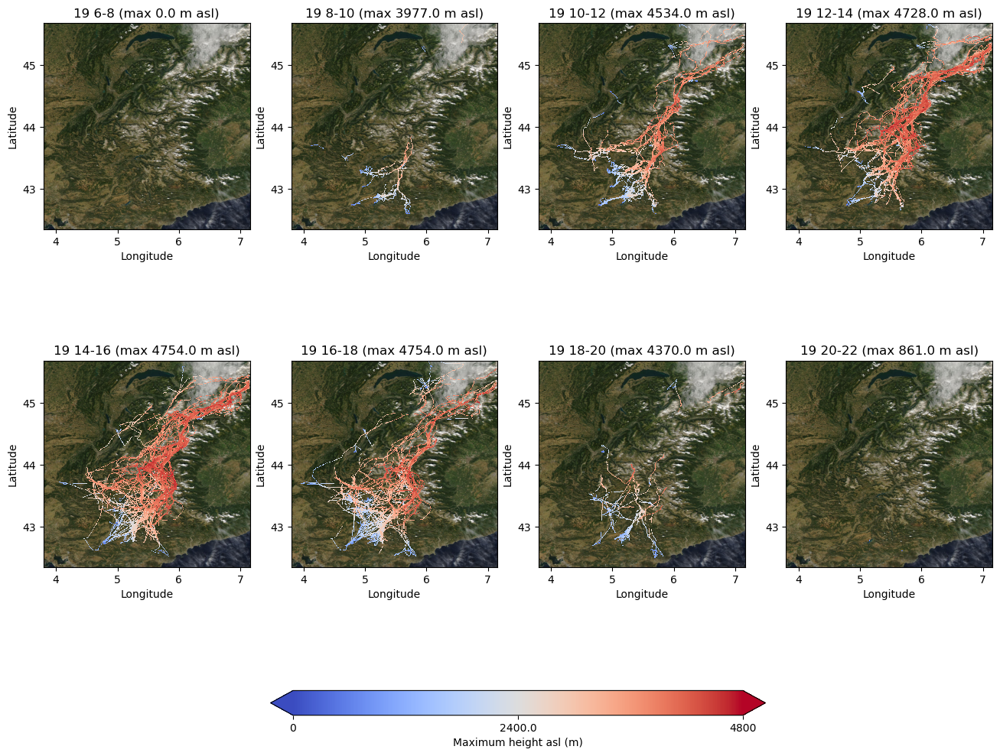

In [26]:
img_extent = (4.7942, 8.1545, 43.3545, 46.6707)
type_vols = ['para','plan']
save_title = 'T:/C2H/STAGES/LEO_BARROIS/figures/max_heght_map_plan_sequential_19.png'
vmax = 4800
day = 'IGC_19-08-2023/'

plot_max_height_sequential(img_extent,'plan',save_title,vmax,day)

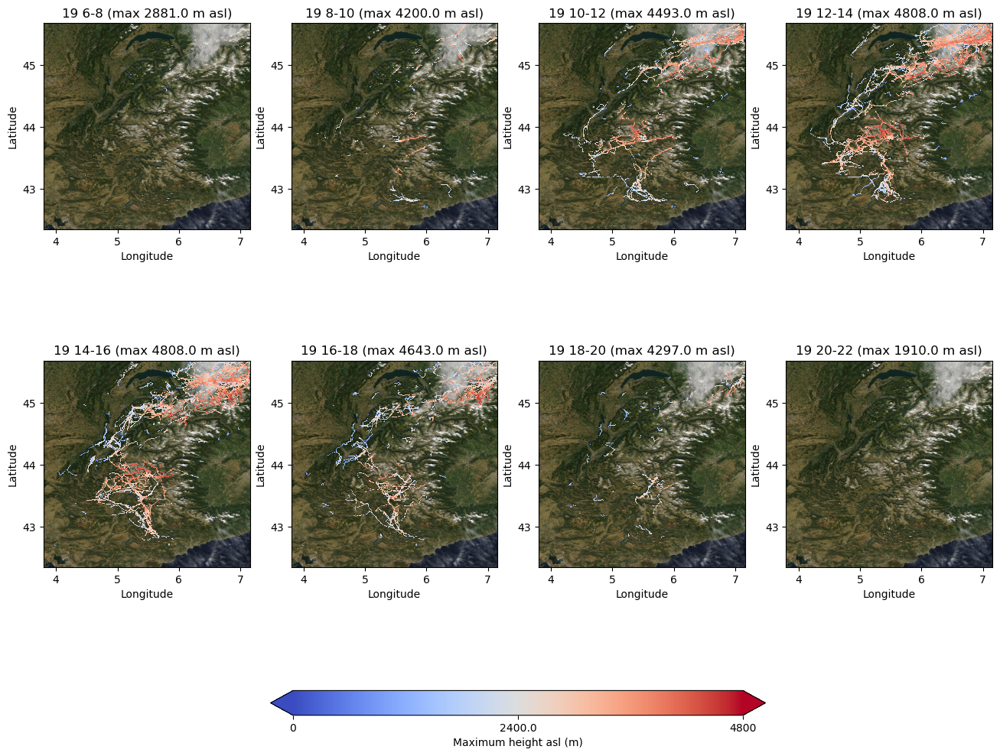

In [27]:
img_extent = (4.7942, 8.1545, 43.3545, 46.6707)
type_vols = ['para','plan']
save_title = 'T:/C2H/STAGES/LEO_BARROIS/figures/max_heght_map_para_sequential_19.png'
vmax = 4800
day = 'IGC_19-08-2023/'

plot_max_height_sequential(img_extent,'para',save_title,vmax,day)

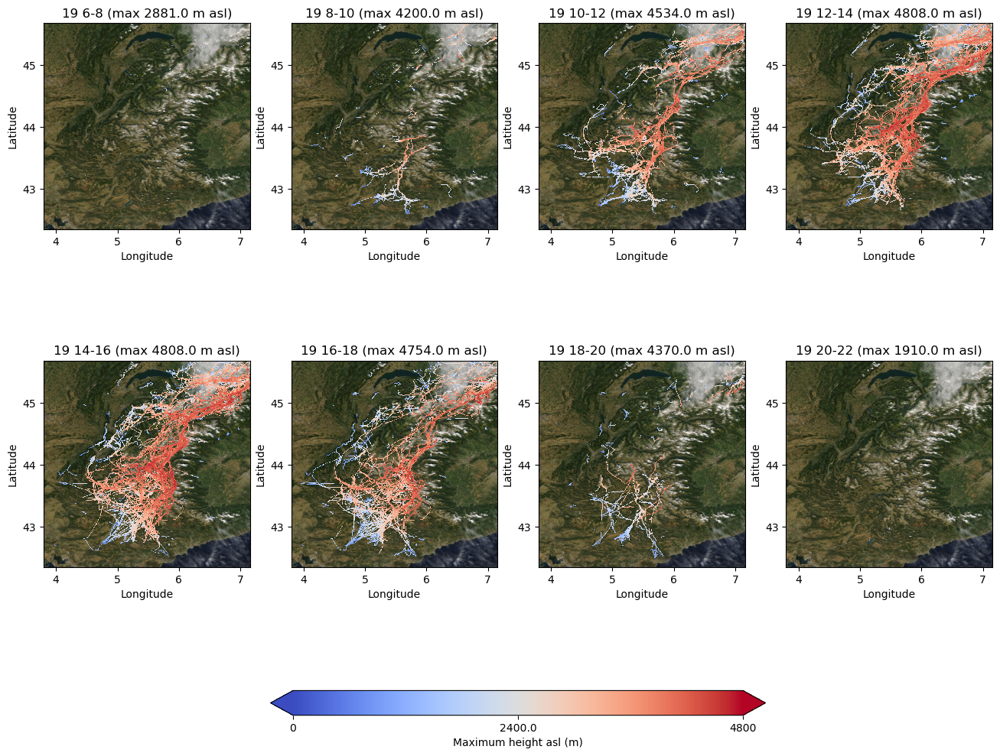

In [28]:
img_extent = (4.7942, 8.1545, 43.3545, 46.6707)
type_vols = ['para','plan']
save_title = 'T:/C2H/STAGES/LEO_BARROIS/figures/max_heght_map_both_sequential_19.png'
vmax = 4800
day = 'IGC_19-08-2023/'

plot_max_height_sequential(img_extent,'both',save_title,vmax,day)

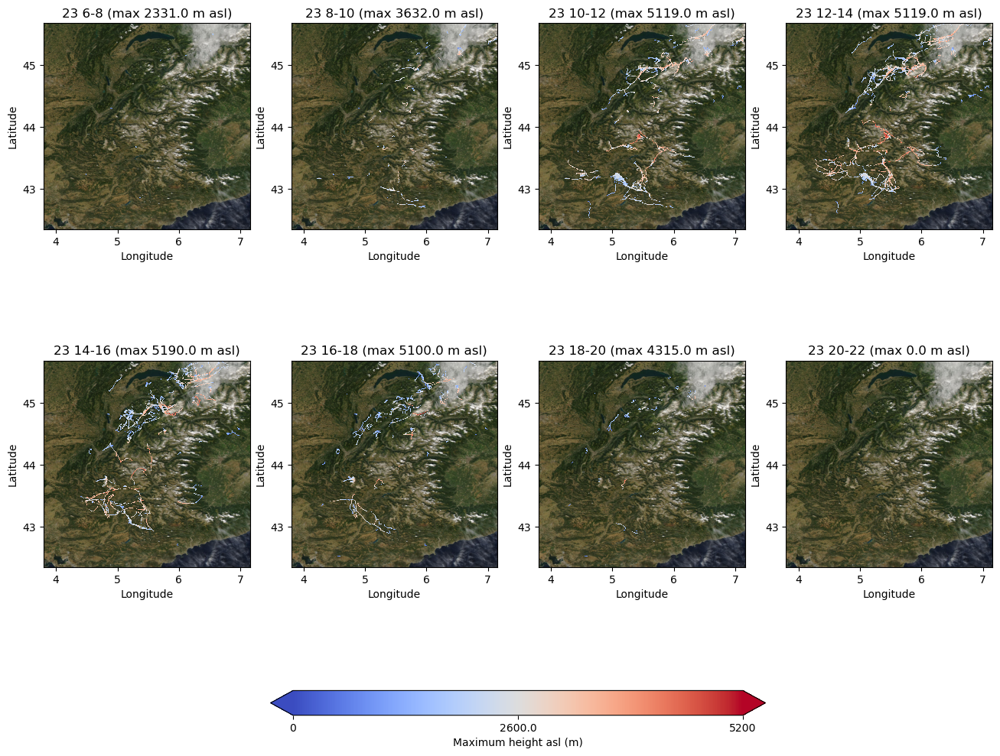

In [30]:
img_extent = (4.7942, 8.1545, 43.3545, 46.6707)
type_vols = ['para','plan']
save_title = 'T:/C2H/STAGES/LEO_BARROIS/figures/max_heght_map_para_sequential_23.png'
vmax = 5200
day = 'IGC_23-08-2023/'

plot_max_height_sequential(img_extent,'para',save_title,vmax,day)

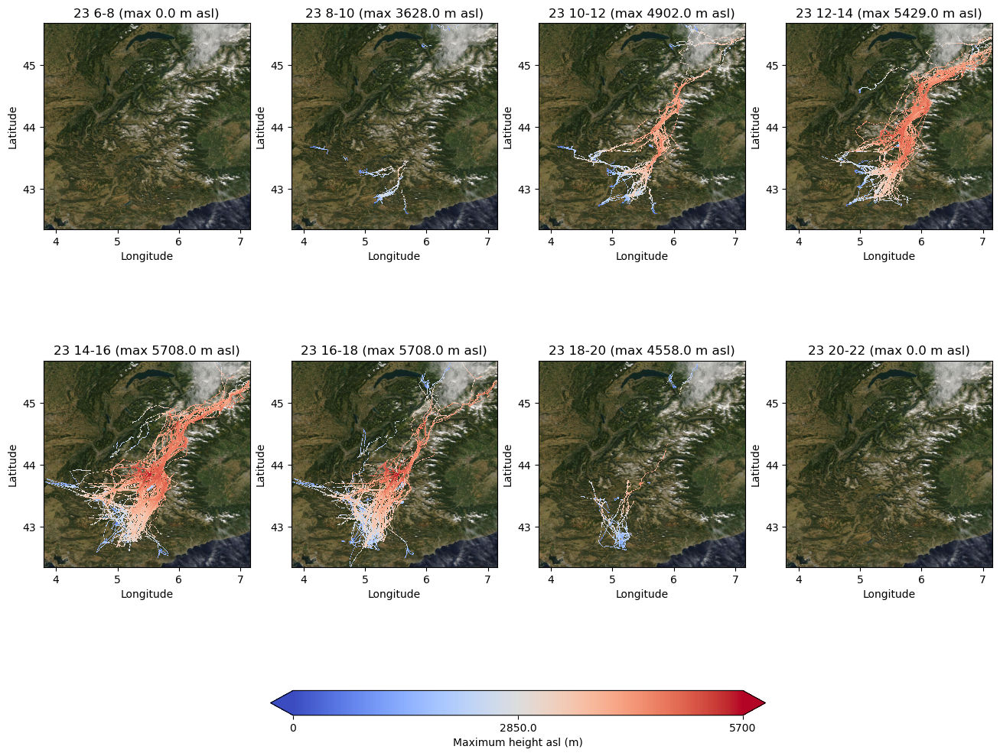

In [31]:
img_extent = (4.7942, 8.1545, 43.3545, 46.6707)
type_vols = ['para','plan']
save_title = 'T:/C2H/STAGES/LEO_BARROIS/figures/max_heght_map_plan_sequential_23.png'
vmax = 5700
day = 'IGC_23-08-2023/'

plot_max_height_sequential(img_extent,'plan',save_title,vmax,day)

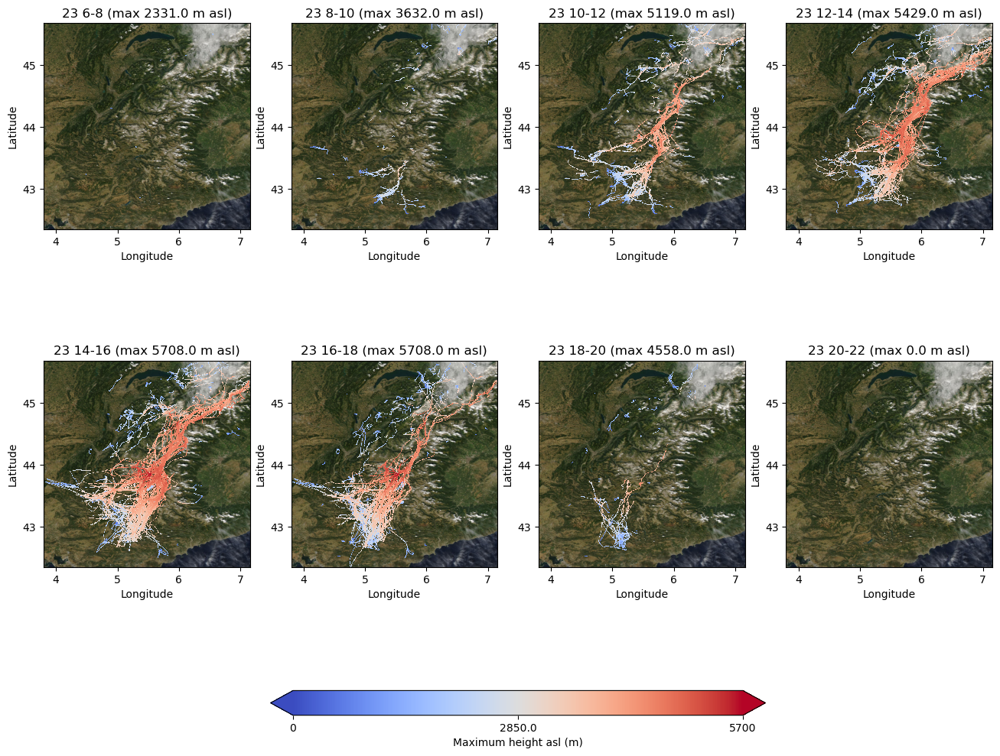

In [32]:
img_extent = (4.7942, 8.1545, 43.3545, 46.6707)
type_vols = ['para','plan']
save_title = 'T:/C2H/STAGES/LEO_BARROIS/figures/max_heght_map_both_sequential_23.png'
vmax = 5700
day = 'IGC_23-08-2023/'

plot_max_height_sequential(img_extent,'both',save_title,vmax,day)

In [ ]:
@njit()
def find_ticks(img_extent,nlat,nlon):
    dlat = (img_extent[3]-img_extent[2])/nlat
    dlon = (img_extent[1]-img_extent[0])/nlon
    lon_to_find = [5,6,7,8]
    lat_to_find = [44,45,46]
    val_lon = []
    val_lat = []
    for i in range(len(lon_to_find)) :
        val_lon.append((lon_to_find[i]-img_extent[0])//dlon)
    for i in range(len(lat_to_find)) :
        val_lat.append((lat_to_find[i]-img_extent[2])//dlat)
    return val_lon,val_lat

def plot_dist_height_sequential(img_extent,type_vol,save_title,vmax,day):
#    days = ['IGC_19-08-2023/','IGC_20-08-2023/','IGC_21-08-2023/','IGC_22-08-2023/','IGC_23-08-2023/','IGC_24-08-2023/']
    titres = [str(i*2+6)+'-'+str((i+1)*2+6) for i in range(0,8)]
#    titres = ["19-08-2023-13-01","20-08-2023-12-28","21-08-2023-12-46","22-08-2023-12-40","23-08-2023-12-21","24-08-2023-13-13"]
    directory_sat = 'C:/Users/barroisl/Documents/Stage_Léo/Satellites/Images_MODIS_VIIRS/'
    fnames = 'Alp_2023-08-19_13H01.jpg'
#    fnames = ['Alp_2023-08-19_13H01.jpg','Alp_2023-08-20_12H28.jpg','Alp_2023-08-21_12H46.jpg',
#          'Alp_2023-08-22_12H40.jpg','Alp_2023-08-23_12H21.jpg','Alp_2023-08-24_13H13.jpg']
    time_stemps = [[i*2,(i+1)*2] for i in range(3,11)]
    
    fig,axs = plt.subplots(nrows=2,ncols=4,figsize=(16, 14))

    nlat,nlon = 500,500
    xticks,yticks = find_ticks(img_extent,nlat,nlon)

    xlabels = [int(((img_extent[1]-img_extent[0])/500)*i + img_extent[0]) for i in xticks]
    ylabels = [int(((img_extent[3]-img_extent[2])/500)*i + img_extent[2]) for i in yticks]
   
    for i in range(len(titres)):
        ax = axs[i//4,i%4]
        time_stemp = time_stemps[i]
        if type_vol == 'para' :
            path_type = 'Parapente_'
        elif type_vol == 'plan' :
            path_type = 'Planeur_'
        elif type_vol == 'both' :
            path_type = 'both_'
        img = plt.imread(os.path.join(directory_sat,fnames))
        ax.imshow(img, extent=[0, 500, 0, 500])
        values = np.load('T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/'+day+path_type+str(time_stemp[0])+'_'+str(time_stemp[1]) +'.npy')
        nlat,nlon = np.shape(values)
        max_height = np.max(values)
        ind = (values == 0)
        new_values = np.ma.masked_array(values,mask=ind)
        
#        vmax = (int(np.max(values)/100)+1)*100
        vmin = 0

        cax = ax.pcolormesh(new_values, vmin=vmin, vmax=vmax, cmap='coolwarm')
        ax.set_title(day[4:6] +' '+ titres[i] + ' (max '+str(max_height) + ' m asl)')
        ax.set_xticks(xticks, labels=xlabels)
        ax.set_yticks(yticks, labels=ylabels)
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")
        
    cbar = fig.colorbar(cax,
                        ax = axs,
                        ticks=[0, vmax/2, vmax],
                        format=mticker.FixedFormatter(['0', str(vmax/2), str(vmax)]),
                        extend='both',
                        orientation='horizontal',
                        label = 'Maximum height asl (m)',
                        fraction = 0.03
                        )
    
    plt.savefig(save_title)
    plt.show()

## Max height plot variogram

In [1]:
from skgstat.models import spherical
import skgstat

In [2]:
values = np.load('T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/IGC_19-08-2023/both.npy')
nlat,nlon = np.shape(values)
ind = (values == 0)
new_values = np.ma.masked_array(values,mask=ind)
a = np.arange(500)
b = np.arange(500)

NameError: name 'np' is not defined

In [ ]:
V = skgstat.Variogram(data[['x', 'y']].values, data.z.values,
              maxlag=90, n_lags=25, model='gaussian', normalize=False)

## De interpoling

In [19]:
@njit
def back_to_large(values):
    gro = np.zeros((50,50))
    for i in range(50):
        for j in range(50):
            a = np.max(values[i*10:(i+1)*10,j*10:(j+1)*10])
            gro[i,j] = a
    return gro

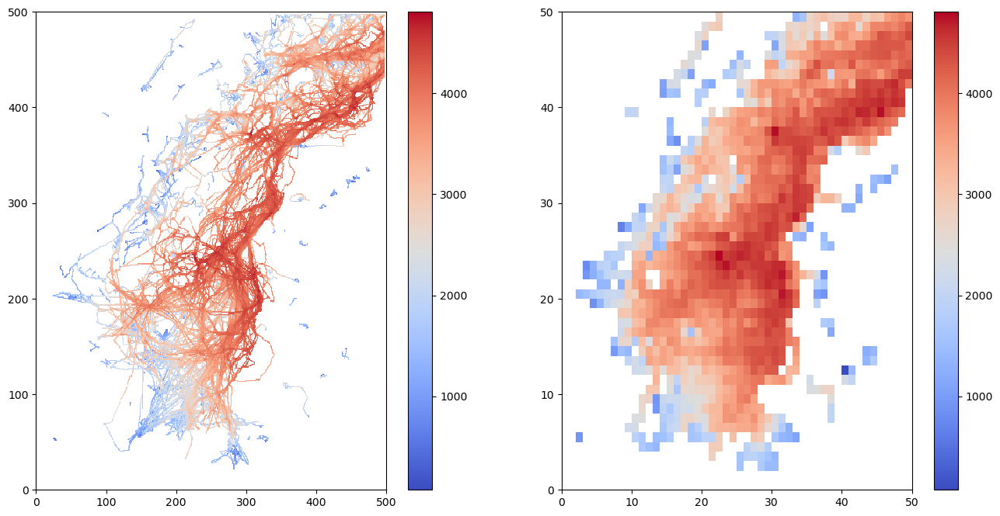

In [40]:
values = np.load('T:/C2H/STAGES/LEO_BARROIS/ndarray/maximum_height_map/IGC_19-08-2023/both.npy')
gro = back_to_large(values)
ind = (values == 0)
new_values = np.ma.masked_array(values,mask=ind)
indgro = (gro == 0)
new_gro = np.ma.masked_array(gro,mask=indgro)

fig = plt.figure(figsize = (16,8))

plt.subplot(1,2,1)
plt.pcolormesh(new_values, cmap ='coolwarm')
plt.colorbar()

plt.subplot(1,2,2)
plt.pcolormesh(new_gro, cmap ='coolwarm')
plt.colorbar()

plt.show()

In [41]:
def search_for_nope(values,i,j,n,m,max_grad=-1000):
    for k in range(5):
        for l in range(5):
            if i+k+1 < 50 and j+l+1<50 :
                dist = np.sqrt((abs(k+1)*80000)**2 + (abs(l+1)*100000)**2)
                if (values[i,j] - values[i+k+1,j+l+1]) < max_grad :
                    return False
                else :
                    return True
            else :
                return True

In [44]:
def vraiment_new_grp(values):
    n,m = np.shape(values)
    tab = np.zeros((n,m))
    for i in range(n):
        for j in range(m):
            if search_for_nope(values,i,j,n,m,max_grad=-500) == False :
                tab[i,j] = np.nan
            else :
                tab[i][j] = values[i,j]
    return tab

C:\Users\barroisl\AppData\Local\Temp\ipykernel_14252\3659784522.py:9: UserWarning: Warning: converting a masked element to nan.
  tab[i][j] = values[i,j]


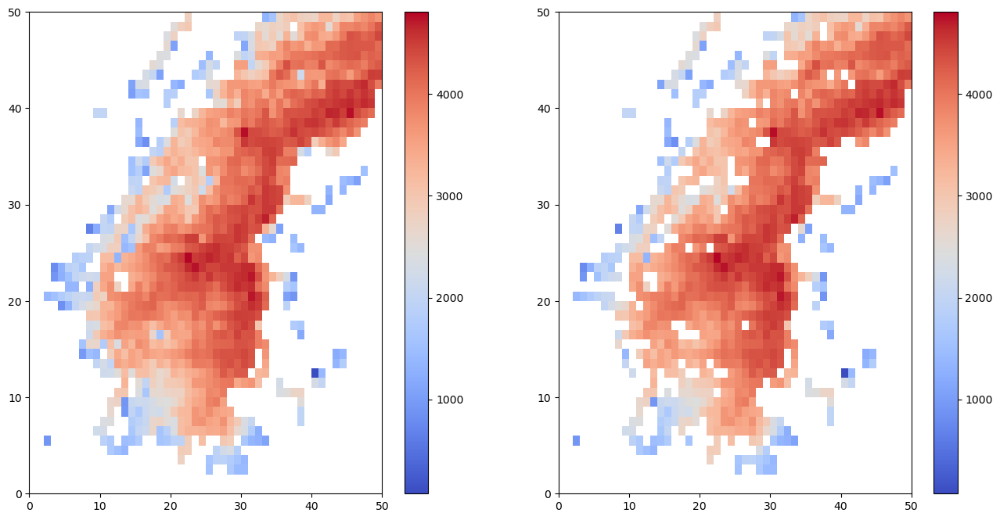

In [45]:
vraiment_new_gro = vraiment_new_grp(new_gro)

fig = plt.figure(figsize = (16,8))

plt.subplot(1,2,1)
plt.pcolormesh(new_gro, cmap ='coolwarm')
plt.colorbar()

plt.subplot(1,2,2)
plt.pcolormesh(vraiment_new_gro, cmap ='coolwarm')
plt.colorbar()

plt.show()